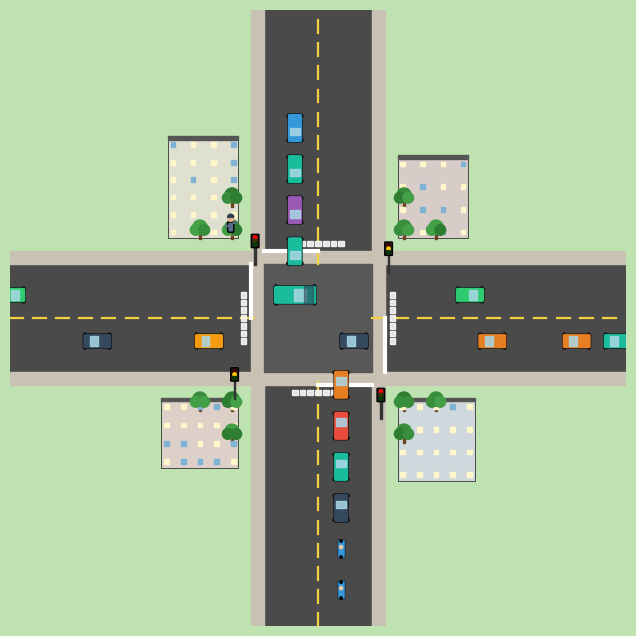

In [9]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.patches import FancyBboxPatch
import matplotlib.animation as animation
from IPython.display import HTML
import random

random.seed(3)

# ---------------- Parameters ----------------
ROAD_HALF    = 4.2
ROAD_W       = ROAD_HALF * 2
SIDEWALK_W   = 1.0
STOP_MARGIN  = 1.0
LANE_OFFSET  = 1.8
VIEW         = 24
SPEED        = 0.42
MIN_GAP      = 3.2
LIGHT_PERIOD = 100
YELLOW_TIME  = 14
SPAWN_PROB   = 0.05

DIRS  = ['N', 'S', 'E', 'W']
AXIS  = {'N': 'V', 'S': 'V', 'E': 'H', 'W': 'H'}
STOP_LINE = ROAD_HALF + STOP_MARGIN

VTYPES = ['car', 'car', 'car', 'bike', 'truck']
VCOLORS = ['#e74c3c', '#3498db', '#2ecc71', '#f39c12', '#9b59b6',
           '#1abc9c', '#e67e22', '#34495e']

VSPEC = {
    'car':   dict(length=2.2, width=1.1, speed_mul=1.0),
    'bike':  dict(length=1.4, width=0.55, speed_mul=1.25),
    'truck': dict(length=3.3, width=1.4, speed_mul=0.75),
}

class Vehicle:
    def __init__(self, d):
        self.d = d
        self.vtype = random.choices(VTYPES, weights=[5, 5, 5, 3, 2])[0]
        self.color = random.choice(VCOLORS)
        spec = VSPEC[self.vtype]
        self.length = spec['length']
        self.width = spec['width']
        self.speed = SPEED * spec['speed_mul'] * random.uniform(0.9, 1.1)
        self.pos = VIEW if d in ('N', 'E') else -VIEW

    def coord(self):
        if self.d == 'N':
            return (-LANE_OFFSET, self.pos)
        elif self.d == 'S':
            return (LANE_OFFSET, self.pos)
        elif self.d == 'E':
            return (self.pos, LANE_OFFSET)
        else:
            return (self.pos, -LANE_OFFSET)

vehicles = []

def light_phase(frame):
    """Returns (green_axis, is_yellow)"""
    cycle = frame % (2 * LIGHT_PERIOD)
    if cycle < LIGHT_PERIOD:
        green = 'V'
        remaining = LIGHT_PERIOD - cycle
    else:
        green = 'H'
        remaining = 2 * LIGHT_PERIOD - cycle
    is_yellow = remaining <= YELLOW_TIME
    return green, is_yellow

def spawn_vehicles():
    for d in DIRS:
        if random.random() < SPAWN_PROB:
            lane_vehicles = [c for c in vehicles if c.d == d]
            too_close = False
            for c in lane_vehicles:
                if d in ('N', 'E') and c.pos > VIEW - MIN_GAP * 1.4:
                    too_close = True
                if d in ('S', 'W') and c.pos < -VIEW + MIN_GAP * 1.4:
                    too_close = True
            if not too_close:
                vehicles.append(Vehicle(d))

def step(frame):
    green_axis, is_yellow = light_phase(frame)
    spawn_vehicles()

    for d in DIRS:
        lane_vehicles = [c for c in vehicles if c.d == d]
        moving_dec = d in ('N', 'E')
        lane_vehicles.sort(key=lambda c: c.pos if moving_dec else -c.pos)

        for i, c in enumerate(lane_vehicles):
            ahead = lane_vehicles[i - 1] if i > 0 else None
            can_go = (AXIS[d] == green_axis) and not is_yellow
            if moving_dec:
                new_pos = c.pos - c.speed
                if ahead is not None:
                    new_pos = max(new_pos, ahead.pos + MIN_GAP)
                entered = c.pos <= ROAD_HALF
                if not entered and not can_go:
                    new_pos = max(new_pos, STOP_LINE)
                c.pos = new_pos
            else:
                new_pos = c.pos + c.speed
                if ahead is not None:
                    new_pos = min(new_pos, ahead.pos - MIN_GAP)
                entered = c.pos >= -ROAD_HALF
                if not entered and not can_go:
                    new_pos = min(new_pos, -STOP_LINE)
                c.pos = new_pos

    vehicles[:] = [c for c in vehicles if -VIEW - 3 <= c.pos <= VIEW + 3]

# ---------------- Scene drawing ----------------
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xlim(-VIEW, VIEW)
ax.set_ylim(-VIEW, VIEW)
ax.set_aspect('equal')
ax.axis('off')
fig.patch.set_facecolor('#bfe3b0')
ax.set_facecolor('#bfe3b0')

def draw_tree(ax, x, y, s=1.0):
    ax.add_patch(patches.Rectangle((x - 0.08 * s, y - 0.5 * s), 0.16 * s, 0.5 * s,
                                    color='#6b4423', zorder=2))
    for dx, dy, r in [(0, 0.35, 0.5), (-0.3, 0.15, 0.38), (0.3, 0.15, 0.38)]:
        ax.add_patch(patches.Circle((x + dx * s, y + dy * s), r * s,
                                     color=random.choice(['#2e7d32', '#388e3c', '#43a047']),
                                     zorder=3))

def draw_building(ax, x, y, w, h, color):
    ax.add_patch(patches.Rectangle((x, y), w, h, color=color, zorder=2,
                                    ec='#333333', lw=0.6))
    ax.add_patch(patches.Rectangle((x, y + h - 0.3), w, 0.3, color='#555555', zorder=2))
    cols = max(2, int(w // 1.1))
    rows = max(2, int(h // 1.3))
    for i in range(cols):
        for j in range(rows):
            wx = x + 0.4 + i * (w - 0.8) / max(cols - 1, 1)
            wy = y + 0.5 + j * (h - 1.2) / max(rows - 1, 1)
            ax.add_patch(patches.Rectangle((wx - 0.18, wy - 0.18), 0.36, 0.36,
                                            color='#fff6c9' if random.random() > 0.3 else '#7fb3d5',
                                            zorder=3))

def draw_static_scene():
    ax.add_patch(patches.Rectangle((-VIEW, -ROAD_HALF), 2 * VIEW, 2 * ROAD_HALF,
                                    color='#4a4a4a', zorder=0))
    ax.add_patch(patches.Rectangle((-ROAD_HALF, -VIEW), 2 * ROAD_HALF, 2 * VIEW,
                                    color='#4a4a4a', zorder=0))
    ax.add_patch(patches.Rectangle((-ROAD_HALF, -ROAD_HALF), 2 * ROAD_HALF, 2 * ROAD_HALF,
                                    color='#585858', zorder=1))
    sw = SIDEWALK_W
    ax.add_patch(patches.Rectangle((-VIEW, ROAD_HALF), 2 * VIEW, sw, color='#c9c2b4', zorder=0))
    ax.add_patch(patches.Rectangle((-VIEW, -ROAD_HALF - sw), 2 * VIEW, sw, color='#c9c2b4', zorder=0))
    ax.add_patch(patches.Rectangle((ROAD_HALF, -VIEW), sw, 2 * VIEW, color='#c9c2b4', zorder=0))
    ax.add_patch(patches.Rectangle((-ROAD_HALF - sw, -VIEW), sw, 2 * VIEW, color='#c9c2b4', zorder=0))

    dash_kw = dict(color='#f4d03f', lw=1.6, zorder=1)
    x = -VIEW
    while x < -ROAD_HALF:
        ax.plot([x, x + 1.0], [0, 0], **dash_kw)
        x += 1.8
    x = ROAD_HALF
    while x < VIEW:
        ax.plot([x, x + 1.0], [0, 0], **dash_kw)
        x += 1.8
    y = -VIEW
    while y < -ROAD_HALF:
        ax.plot([0, 0], [y, y + 1.0], **dash_kw)
        y += 1.8
    y = ROAD_HALF
    while y < VIEW:
        ax.plot([0, 0], [y, y + 1.0], **dash_kw)
        y += 1.8

    ax.plot([-ROAD_HALF, 0], [STOP_LINE, STOP_LINE], color='white', lw=3, zorder=1)
    ax.plot([0, ROAD_HALF], [-STOP_LINE, -STOP_LINE], color='white', lw=3, zorder=1)
    ax.plot([STOP_LINE, STOP_LINE], [-ROAD_HALF, 0], color='white', lw=3, zorder=1)
    ax.plot([-STOP_LINE, -STOP_LINE], [0, ROAD_HALF], color='white', lw=3, zorder=1)

    for base, horiz in [(STOP_LINE + 0.6, False), (-STOP_LINE - 0.6, False),
                         (STOP_LINE + 0.6, True), (-STOP_LINE - 0.6, True)]:
        for k in range(-3, 4):
            off = k * 0.6
            if horiz:
                ax.add_patch(patches.Rectangle((base - 0.2, off - 0.22), 0.4, 0.44,
                                                color='white', zorder=1, alpha=0.85))
            else:
                ax.add_patch(patches.Rectangle((off - 0.22, base - 0.2), 0.44, 0.4,
                                                color='white', zorder=1, alpha=0.85))

    b_positions = [
        (ROAD_HALF + sw + 1, ROAD_HALF + sw + 1, 5.5, 6.5, '#d7ccc8'),
        (-ROAD_HALF - sw - 6.5, ROAD_HALF + sw + 1, 5.5, 8.0, '#e0e0d1'),
        (ROAD_HALF + sw + 1, -ROAD_HALF - sw - 7.5, 6.0, 6.5, '#cfd8dc'),
        (-ROAD_HALF - sw - 7.0, -ROAD_HALF - sw - 6.5, 6.0, 5.5, '#ddd0c8'),
    ]
    for x, y, w, h, color in b_positions:
        draw_building(ax, x, y, w, h, color)

    tree_spots = []
    for tx in [-ROAD_HALF - sw - 1.5, ROAD_HALF + sw + 1.5]:
        for ty in [ROAD_HALF + sw + 1.5, ROAD_HALF + sw + 4.0,
                   -ROAD_HALF - sw - 1.5, -ROAD_HALF - sw - 4.0]:
            tree_spots.append((tx, ty))
    for ty in [-ROAD_HALF - sw - 1.5, ROAD_HALF + sw + 1.5]:
        for tx in [ROAD_HALF + sw + 4.0, -ROAD_HALF - sw - 4.0]:
            tree_spots.append((tx, ty))
    for x, y in tree_spots:
        draw_tree(ax, x, y, s=1.1)

draw_static_scene()

def draw_signal_pole(ax, x, y):
    pole = patches.Rectangle((x - 0.06, y - 1.4), 0.12, 1.4, color='#333333', zorder=5)
    ax.add_patch(pole)
    box = patches.FancyBboxPatch((x - 0.28, y), 0.56, 1.0,
                                  boxstyle="round,pad=0.02,rounding_size=0.05",
                                  facecolor='#222222', edgecolor='black', zorder=6)
    ax.add_patch(box)
    red = patches.Circle((x, y + 0.78), 0.13, color='#3d0000', zorder=7)
    yellow = patches.Circle((x, y + 0.5), 0.13, color='#3d3300', zorder=7)
    green = patches.Circle((x, y + 0.22), 0.13, color='#003d00', zorder=7)
    ax.add_patch(red); ax.add_patch(yellow); ax.add_patch(green)
    return red, yellow, green

signal_lights = {
    'N': draw_signal_pole(ax, -ROAD_HALF - 0.7, STOP_LINE + 0.3),
    'S': draw_signal_pole(ax, ROAD_HALF + 0.7, -STOP_LINE - 1.3),
    'E': draw_signal_pole(ax, STOP_LINE + 0.3, ROAD_HALF + 0.7),
    'W': draw_signal_pole(ax, -STOP_LINE - 1.3, -ROAD_HALF - 0.7),
}

def draw_traffic_police(ax, x, y):
    patches_list = []
    body = patches.FancyBboxPatch((x - 0.22, y - 0.1), 0.44, 0.75,
                                   boxstyle="round,pad=0.02,rounding_size=0.1",
                                   facecolor='#5b6b8c', edgecolor='black', zorder=8)
    head = patches.Circle((x, y + 0.95), 0.22, color='#e0ac8b', zorder=9)
    cap = patches.Wedge((x, y + 1.05), 0.24, 0, 180, color='#2c3e50', zorder=10)
    arm1 = patches.Rectangle((x - 0.42, y + 0.4), 0.2, 0.08, color='#5b6b8c', zorder=8)
    arm2 = patches.Rectangle((x + 0.22, y + 0.55), 0.2, 0.08, angle=25, color='#5b6b8c', zorder=8)
    for p in [body, head, cap, arm1, arm2]:
        ax.add_patch(p)
        patches_list.append(p)
    return patches_list

draw_traffic_police(ax, -ROAD_HALF - 2.6, ROAD_HALF + 2.6)

def vehicle_patches(v):
    x, y = v.coord()
    axis = AXIS[v.d]
    L, W = v.length, v.width
    plist = []
    if axis == 'V':
        w, h = W, L
    else:
        w, h = L, W

    if v.vtype == 'bike':
        body = patches.Rectangle((x - w / 2, y - h / 2), w, h,
                                  color=v.color, zorder=4, ec='black', lw=0.3)
        plist.append(body)
        if axis == 'V':
            plist.append(patches.Circle((x, y + h / 2 - 0.08), 0.09, color='black', zorder=5))
            plist.append(patches.Circle((x, y - h / 2 + 0.08), 0.09, color='black', zorder=5))
        else:
            plist.append(patches.Circle((x + w / 2 - 0.08, y), 0.09, color='black', zorder=5))
            plist.append(patches.Circle((x - w / 2 + 0.08, y), 0.09, color='black', zorder=5))
        plist.append(patches.Circle((x, y + (0.15 if axis == 'V' else 0)),
                                     0.12, color='#f0c8a0', zorder=6))
    else:
        body = FancyBboxPatch((x - w / 2, y - h / 2), w, h,
                               boxstyle="round,pad=0.02,rounding_size=0.15",
                               facecolor=v.color, edgecolor='black', lw=0.4, zorder=4)
        plist.append(body)
        if axis == 'V':
            gw, gh = w * 0.7, h * 0.28
            gx, gy = x - gw / 2, y - gh / 2 + (h * 0.12 if v.d == 'S' else -h * 0.12)
        else:
            gw, gh = w * 0.28, h * 0.7
            gx, gy = x - gw / 2 + (w * 0.12 if v.d == 'E' else -w * 0.12), y - gh / 2
        plist.append(patches.Rectangle((gx, gy), gw, gh, color='#a9d6e5', zorder=5, alpha=0.85))
        if axis == 'V':
            for wy in (y - h / 2 + 0.15, y + h / 2 - 0.15):
                for wx in (x - w / 2 - 0.02, x + w / 2 - 0.06):
                    plist.append(patches.Circle((wx + 0.04, wy), 0.11, color='#1c1c1c', zorder=3))
        else:
            for wx in (x - w / 2 + 0.15, x + w / 2 - 0.15):
                for wy in (y - h / 2 - 0.02, y + h / 2 - 0.06):
                    plist.append(patches.Circle((wx, wy + 0.04), 0.11, color='#1c1c1c', zorder=3))
        if v.vtype == 'truck':
            if axis == 'V':
                cy = y + h / 2 - h * 0.18 if v.d == 'S' else y - h / 2 + h * 0.18
                plist.append(patches.Rectangle((x - w / 2, cy - h * 0.1), w, h * 0.2,
                                                color='#2c3e50', zorder=5, alpha=0.55))
            else:
                cx = x + w / 2 - w * 0.18 if v.d == 'E' else x - w / 2 + w * 0.18
                plist.append(patches.Rectangle((cx - w * 0.1, y - h / 2), w * 0.2, h,
                                                color='#2c3e50', zorder=5, alpha=0.55))
    for p in plist:
        ax.add_patch(p)
    return plist

vehicle_artists = []

def update_signal_colors(green_axis, is_yellow):
    for d in DIRS:
        red, yellow, green = signal_lights[d]
        on_axis = AXIS[d] == green_axis
        if on_axis and not is_yellow:
            red.set_color('#3d0000'); yellow.set_color('#3d3300'); green.set_color('#00e600')
        elif on_axis and is_yellow:
            red.set_color('#3d0000'); yellow.set_color('#ffcc00'); green.set_color('#003d00')
        else:
            red.set_color('#ff0000'); yellow.set_color('#3d3300'); green.set_color('#003d00')

def init():
    return []

def animate(frame):
    global vehicle_artists
    step(frame)
    green_axis, is_yellow = light_phase(frame)
    update_signal_colors(green_axis, is_yellow)

    for p in vehicle_artists:
        p.remove()
    vehicle_artists = []

    for v in vehicles:
        vehicle_artists.extend(vehicle_patches(v))

    return vehicle_artists

anim = animation.FuncAnimation(fig, animate, init_func=init, frames=400, interval=50, blit=False)
HTML(anim.to_jshtml())